In [4]:
import numpy as np
import matplotlib.pyplot as plt

def nelder_mead(f, n, minn, maxx):
    count = n+1
    x = np.random.rand(n+1, 2)*(maxx-minn)+minn
    alpha = 1.0
    betta = 0.5
    gamma = 2.0
    
    kk = np.linspace(minn, maxx, 50)

    # filling the heatmap, value by value
    fun_map = np.empty((kk.size, kk.size))
    for i in range(kk.size):
        for j in range(kk.size):
            fun_map[i,j] = f([kk[j], kk[i]])
    
    # simplex iter
    while True:
        dr = np.concatenate([np.array(x), [x[0]]])
        plt.plot(dr[:,0], dr[:,1], color='red')
        plt.contour(kk,kk,fun_map, np.linspace(fun_map.min(), fun_map.max(), 100))
        plt.show()   
        
        fs = [(f(xxx), i) for i, xxx in enumerate(x)]
        
        # order
        fs_sort = sorted(fs, key=lambda a_entry: a_entry[0]) 

        fs = [fc[0] for fc in fs]
       
        i_h = fs_sort[-1][1]
        i_l = fs_sort[0][1]
        i_g = fs_sort[-2][1]
        
        if fs[i_h] - fs[i_l] < 0.00001:
            return np.mean(x, axis=0), count
        
        # centroid
        x_c = (np.sum(x, axis=0) - x[i_h])/n
        # reflection
        x_r = x_c + alpha*(x_c-x[i_h])
        f_r = f(x_r)
        count += 1
        
        # expansion
        if f_r < fs[i_l]:
            x_e = x_c + gamma*(x_r - x_c)
            f_e = f(x_e)
            count += 1
            if f_e < fs[i_l]:
                x[i_h] = x_e
            else:
                x[i_h] = x_r
        elif fs[i_l] < f_r < fs[i_g]:
            x[i_h] = x_r
        else:
            if fs[i_h] > f_r:
                x[i_h] = x_r
            # contraction
            x_s = x_c + betta*(x[i_h] - x_c)
            f_s = f(x_s)
            count += 1
            if f_s < fs[i_h]:
                x[i_h] = x_s
            else:
                # reduction
                x = [x[i_l] + (xi-x[i_l])/2 for xi in x]
        

In [5]:
def himmelbau(x):
    return (x[0]**2 + x[1] - 11)**2 + (x[0] + x[1]**2 - 7)**2

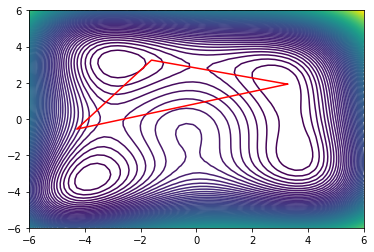

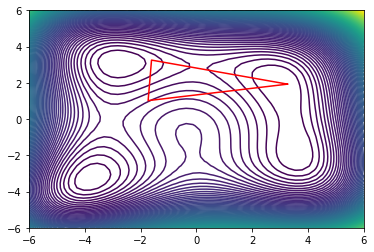

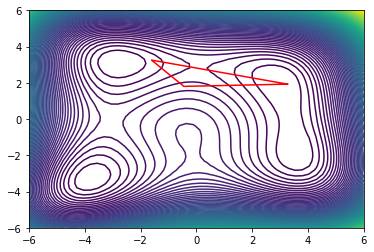

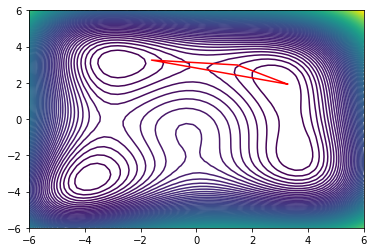

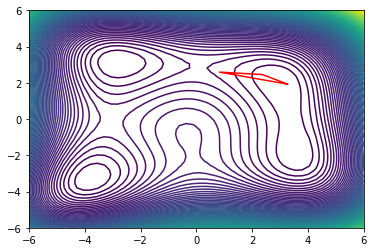

...

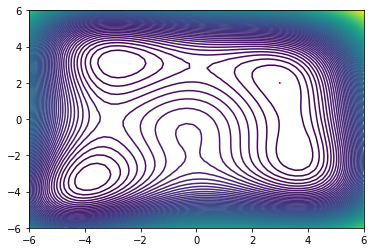

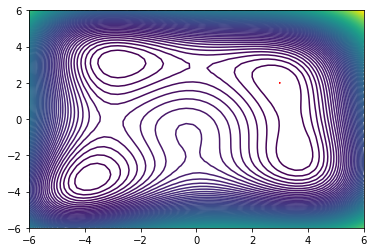

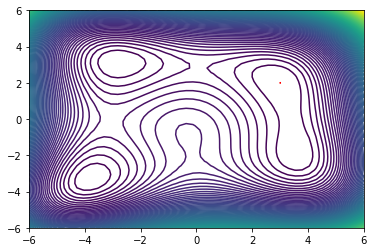

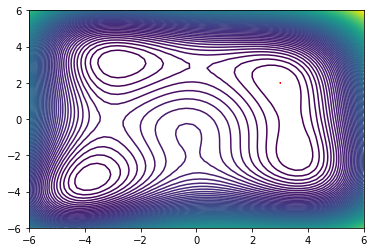

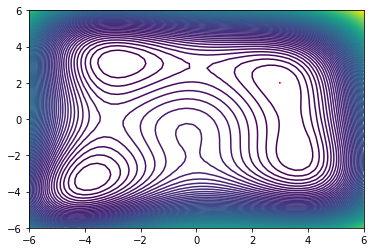

In [6]:
res,count = nelder_mead(himmelbau, 2, -6, 6)

In [7]:
print (himmelbau(res), count)

2.2484952639771906e-07 58


In [8]:
def bird(x):
    return np.sin(x[1])*np.exp((1-np.cos(x[0]))**2)+np.cos(x[0])*np.exp((1-np.sin(x[1]))**2) + (x[0]-x[1])**2

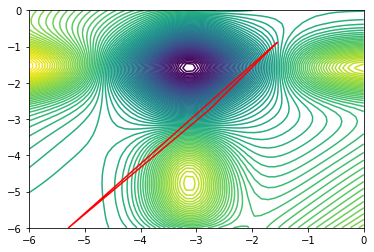

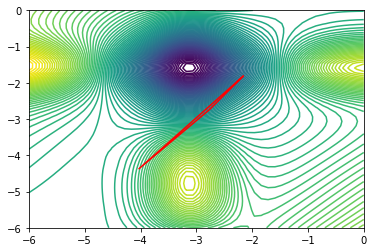

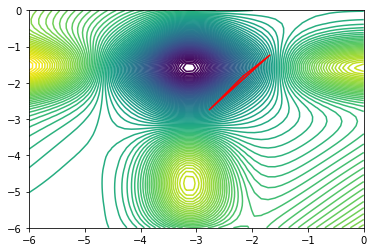

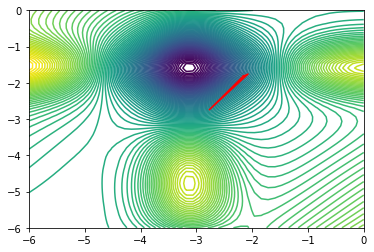

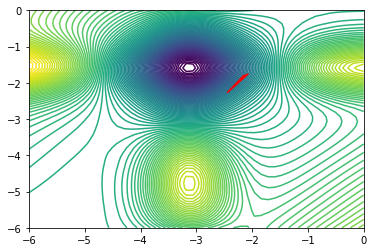

...

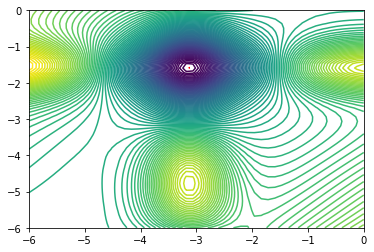

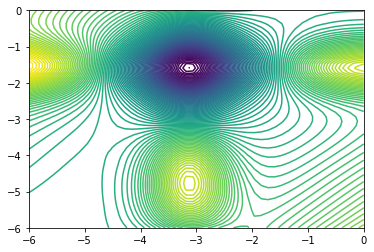

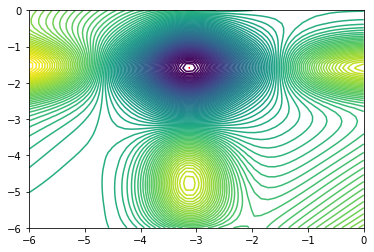

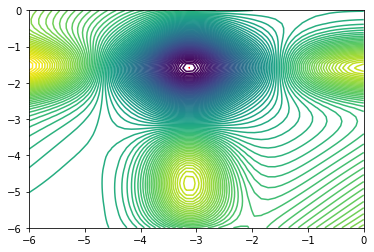

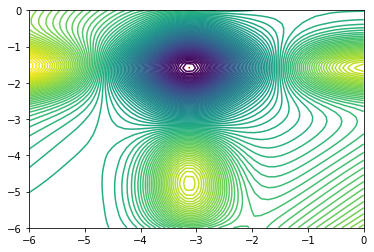

In [9]:
res, count = nelder_mead(bird, 2, -6, 0)

In [10]:
bird(res)

-106.76453564131636

In [11]:
count

77